In [1]:
!pip install prody
!pip install py3dmol

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.7/21.7 MB 19.6 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 4.3 MB/s eta 0:00:0000:0100:01m
  Created wheel for prody: filename=ProDy-2.4.1-cp38-cp38-linux_x86_64.whl size=22401038 sha256=042f4a1ac87127f0bf0f01103fc71c078aa2811096cd66c08473248b352d693d
  Stored in directory: /scratch/sriram_pip/wheels/ac/8c/78/5b90214f9f67b4b1424ef12c3dd2db1361f9957d316f08e847
Successfully built prody
  Attempting uninstall: biopython
    Found existing installation: biopython 1.83
    Uninstalling biopython-1.83:
      Successfully uninstalled biopython-1.83


In [2]:
import os
import torch
import numpy as np
import math
from tqdm import tqdm
import wandb
import pickle
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import seaborn as sns

from data.rna_object import RNA
from data.dataloader import get_train_test_dataloaders, RNATorsionalAnglesDataset, collate_fn

from torch.utils.data import DataLoader

from models.transformer import TorsionalAnglesTransformerDecoder

from sys import stdout
import py3Dmol
import prody

In [3]:
perfect_pdb_files_train_val_test_path="/home2/sriram.devata/rna_project/cdhit/torrna_train_val_test.pkl"

with open(perfect_pdb_files_train_val_test_path, "rb") as fp:
        training_pdbs, validation_pdbs, testing_pdbs = pickle.load(fp)
testing_pdbs = [x.replace('_','') for x in testing_pdbs]

In [4]:
dict_attr = type('dict_attr', (object,), {})
args = dict_attr()
args.lr = 2e-4
args.embeddim = 640
args.hiddendim = 256
args.numheads = 4
args.numlayers = 3
args.dropout = 0.2
args.tol = 5

model = TorsionalAnglesTransformerDecoder(embed_dim=args.embeddim, hidden_dim=args.hiddendim, num_heads=args.numheads, num_layers=args.numlayers, dropout=args.dropout)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.load_state_dict(torch.load(f"/home2/sriram.devata/rna_project/rna_transformer/checkpoints/torrna_best_model_rna_transformer_{args.lr}_{args.embeddim}_{args.hiddendim}_{args.numheads}_{args.numlayers}_{args.dropout}_{args.tol}.pkl", map_location=device))
model.eval()
print(model)

TorsionalAnglesTransformerDecoder(
  (transformer_decoder): TransformerDecoder(
    (layers): ModuleList(
      (0-2): 3 x TransformerDecoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=640, out_features=640, bias=True)
        )
        (multihead_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=640, out_features=640, bias=True)
        )
        (linear1): Linear(in_features=640, out_features=2048, bias=True)
        (dropout): Dropout(p=0.2, inplace=False)
        (linear2): Linear(in_features=2048, out_features=640, bias=True)
        (norm1): LayerNorm((640,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((640,), eps=1e-05, elementwise_affine=True)
        (norm3): LayerNorm((640,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.2, inplace=False)
        (dropout2): Dropout(p=0.2, inplace=False)
        (dropout3): Dropout(p=0.2, in

In [5]:
# ------------------- Helper functions -------------------

all_dihedral_angle_names = ["alpha ($\\alpha$)" ,"beta ($\\beta$)" ,"gamma ($\\gamma$)" ,"delta ($\\delta$)" ,"chi ($\\chi$)" ,"epsilon ($\\epsilon$)" ,"zeta ($\\zeta$)" ,"eta ($\\eta$)" ,"theta ($\\theta$)"]

def convert_to_rad_and_back_to_degree(cur_res_spot_rna_pred_angles):

        final_degree_angles = list()
        for each_angle in cur_res_spot_rna_pred_angles:
                torsion_angle = torch.tensor([each_angle * math.pi / 180])
                final_degree_angle = torch.arctan2(torch.sin(torsion_angle),torch.cos(torsion_angle)).item() * 180 / math.pi
                final_degree_angles.append(final_degree_angle)

        return final_degree_angles

def make_rad_angle_tensor_to_deg_angle_list(rad_angle_tensor):

        constructed_angles = list()
        for each_angle_idx in range(len(all_dihedral_angle_names)):
                cos_angle = rad_angle_tensor[2*each_angle_idx]
                sin_angle = rad_angle_tensor[2*each_angle_idx+1]
                rad_angle = torch.arctan2(sin_angle,cos_angle)
                deg_angle = rad_angle.item() * 180 / math.pi
                constructed_angles.append(deg_angle)

        return constructed_angles

def calculate_mae(predicted, groundtruth, prediction_method="Unknown"):

        angle_errors_to_export = list()
        all_angle_errors = list()
        for each_angle_idx in range(len(all_dihedral_angle_names)):
                all_angle_errors.append(list())
                angle_errors_to_export.append(list())

        for each_rna_idx in range(len(predicted)):

                for each_angle_idx in range(len(all_dihedral_angle_names)):
                        angle_errors_to_export[each_angle_idx].append(list())

                for each_residue_idx in range(len(predicted[each_rna_idx])):

                        predicted_angles = predicted[each_rna_idx][each_residue_idx]
                        gt_angles = groundtruth[each_rna_idx][each_residue_idx]

                        for each_angle_idx in range(len(all_dihedral_angle_names)):

                                if prediction_method == "Random Baseline":
                                        difference = abs(predicted_angles[each_angle_idx] - gt_angles[each_angle_idx])
                                        difference = sum(difference)/len(difference)
                                        difference = difference.item()
                                else:
                                        difference = abs(predicted_angles[each_angle_idx] - gt_angles[each_angle_idx])

                                difference = min(difference, 360-difference)
                                if math.isnan(difference):
                                        continue
                                all_angle_errors[each_angle_idx].append(difference)
                                angle_errors_to_export[each_angle_idx][-1].append(difference)

        return_maes = list()
        all_errors = list()

#         print(f"\n----------\nMAEs for all dihedral angles predicted by {prediction_method}")
        for each_angle_idx in range(len(all_dihedral_angle_names)):
                mae = sum(all_angle_errors[each_angle_idx])/len(all_angle_errors[each_angle_idx])
                return_maes.append(mae)
                all_errors.append(all_angle_errors[each_angle_idx])
#                 print(f"{all_dihedral_angle_names[each_angle_idx]}: {mae:.3f}")

        return return_maes, all_errors, angle_errors_to_export



In [7]:
all_minimum_mae_rows = list()
all_maximum_mae_rows = list()

rnapot_decoys_directory = "/home2/sriram.devata/rna_project/rnapot/decoys/"
for each_decoy_idx, each_decoy_dir in enumerate(os.listdir(rnapot_decoys_directory)):
    print(each_decoy_idx)
    if each_decoy_idx >= 500:
        break
    
    if not os.path.isdir(f"{rnapot_decoys_directory}/{each_decoy_dir}"):
        continue
        
    try:
        cur_decoy_dir = f"{rnapot_decoys_directory}/{each_decoy_dir}"

        decoy_original_rna_object = RNA(f"{cur_decoy_dir}/{each_decoy_dir}.pdb", calc_rna_fm_embeddings=True, load_dssr_dihedrals=True, load_coords=False, dssr_path=cur_decoy_dir)

        # --- Predict the dihedral angles with TorRNA ---
        rna_fm_embeddings = decoy_original_rna_object.rna_fm_embeddings.unsqueeze(0).to(device)
        initial_embeddings = decoy_original_rna_object.rna_fm_initial_embeddings.unsqueeze(0).to(device)
        gt_torsional_angles = decoy_original_rna_object.dssr_torsion_angles.unsqueeze(0).to(device)
        padding_mask = torch.sum(torch.abs(gt_torsional_angles), dim=-1) < 1e-5
        output = model(rna_fm_embeddings, padding_mask, initial_embeddings).detach().cpu()[0]
        all_predicted_angles_original_pdb = list()
        for each_residue_idx in range(len(output)):
            if padding_mask[0][each_residue_idx]:
                continue	# True if this residue is padded
            predicted_angles = make_rad_angle_tensor_to_deg_angle_list(output[each_residue_idx])
            all_predicted_angles_original_pdb.append(predicted_angles)



        each_decoy_all_rmsds = pd.read_csv(f"{rnapot_decoys_directory}/{each_decoy_dir}/{each_decoy_dir}.rmsd", delim_whitespace=True)
        each_decoy_all_rmsds.rename(columns = {'#':'Structure', 'STRUCTURE':'PROB', 'PROB':"RMSD-C3'", "RMSD-C3'":"GDT-C3'", "GDT-C3'":"RMSD-ALL", "RMSD-ALL":"GDT-ALL", "GDT-ALL":"MAE"}, inplace = True) 
        each_decoy_all_rmsds = each_decoy_all_rmsds[["Structure", "RMSD-ALL", "GDT-ALL", "MAE"]]
        each_decoy_all_rmsds['MAE'] = each_decoy_all_rmsds['MAE'].astype('object')

        for row_index, row in tqdm(each_decoy_all_rmsds.iterrows(), total=each_decoy_all_rmsds.shape[0]):

            # get the DSSR angles of each of the structures 
            each_structure_rna_object = RNA(f"{cur_decoy_dir}/{row['Structure']}.pdb", calc_rna_fm_embeddings=True, load_dssr_dihedrals=True, load_coords=False, dssr_path=cur_decoy_dir)

            each_structure_angles = each_structure_rna_object.dssr_torsion_angles.unsqueeze(0).to(device)
            all_each_structure_angles = list()
            for each_residue_idx in range(len(each_structure_angles[0])):
                cur_res_gt_angles = make_rad_angle_tensor_to_deg_angle_list(each_structure_angles[0][each_residue_idx])
                all_each_structure_angles.append(cur_res_gt_angles)

            if len(all_predicted_angles_original_pdb) != len(all_each_structure_angles):
                continue # some of the decoys have a different number of residues for some reason

            all_maes, all_predicted_errors, angle_errors_to_export = calculate_mae([all_predicted_angles_original_pdb], [all_each_structure_angles], prediction_method="TorRNA")

            all_maes = np.array(all_maes, dtype='object')
            each_decoy_all_rmsds.at[row_index, 'MAE'] = all_maes


        only_decoys = each_decoy_all_rmsds[each_decoy_all_rmsds['Structure'].str.contains("_")]
        only_decoys['MAE_sum'] = only_decoys.apply(lambda row: np.sum(row['MAE']), axis=1)

        max_mae_row = only_decoys.iloc[only_decoys['MAE_sum'].idxmax()]
        min_mae_row = only_decoys.iloc[only_decoys['MAE_sum'].idxmin()]

        all_maximum_mae_rows.append(max_mae_row)
        all_minimum_mae_rows.append(min_mae_row)
        
        with open('maximum_minimum_temp.pkl', 'wb') as f:
            pickle.dump((all_minimum_mae_rows,all_maximum_mae_rows), f)
        
    except Exception as e:
        print(f"Error {e} for {each_decoy_dir}")

0


 19%|█▉        | 94/501 [00:09<00:40, 10.04it/s]


KeyboardInterrupt: 

In [6]:
with open('maximum_minimum.pkl', 'rb') as f:
    all_minimum_mae_rows,all_maximum_mae_rows = pickle.load(f)

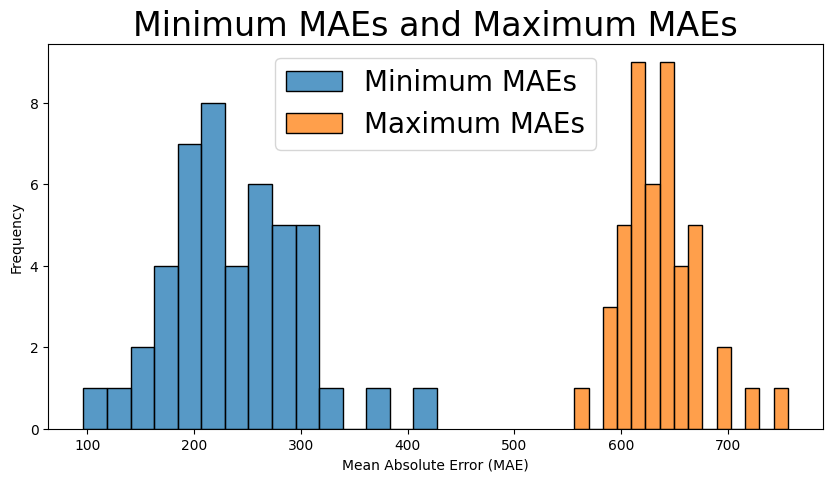

In [8]:
fig, axs = plt.subplots(1,1, figsize=(10, 5))
plt.rcParams.update({'font.size': 20})
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16)

sns.histplot([x['MAE_sum'] for x in all_minimum_mae_rows], label="Minimum MAEs", bins=15)
sns.histplot([x['MAE_sum'] for x in all_maximum_mae_rows], label="Maximum MAEs", bins=15)

# axs.hist([x['MAE_sum'] for x in all_minimum_mae_rows], label="Minimum MAEs")
# axs.hist([x['MAE_sum'] for x in all_maximum_mae_rows], label="Maximum MAEs")

plt.title("Minimum MAEs and Maximum MAEs")

plt.xlabel("Mean Absolute Error (MAE)")
plt.ylabel("Frequency")

plt.legend()
plt.savefig('images/min_max_mae.svg', dpi=300, bbox_inches = 'tight')
plt.show()

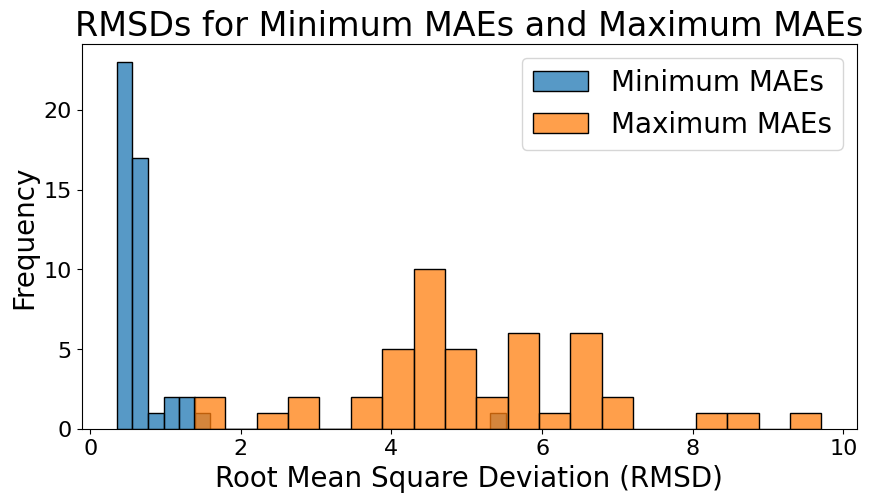

In [9]:
fig, axs = plt.subplots(1,1, figsize=(10, 5))

sns.histplot([x['RMSD-ALL'] for x in all_minimum_mae_rows], label="Minimum MAEs", bins=25)
sns.histplot([x['RMSD-ALL'] for x in all_maximum_mae_rows], label="Maximum MAEs", bins=20)

# axs.hist([x['RMSD-ALL'] for x in all_minimum_mae_rows], label="Minimum MAEs")
# axs.hist([x['RMSD-ALL'] for x in all_maximum_mae_rows], label="Maximum MAEs")

plt.title("RMSDs for Minimum MAEs and Maximum MAEs")

plt.xlabel("Root Mean Square Deviation (RMSD)")
plt.ylabel("Frequency")

plt.legend()
plt.savefig('images/min_max_mae_rmsds.svg', dpi=300, bbox_inches = 'tight')
plt.show()

/tmp/ipykernel_20888/1139575549.py:37: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


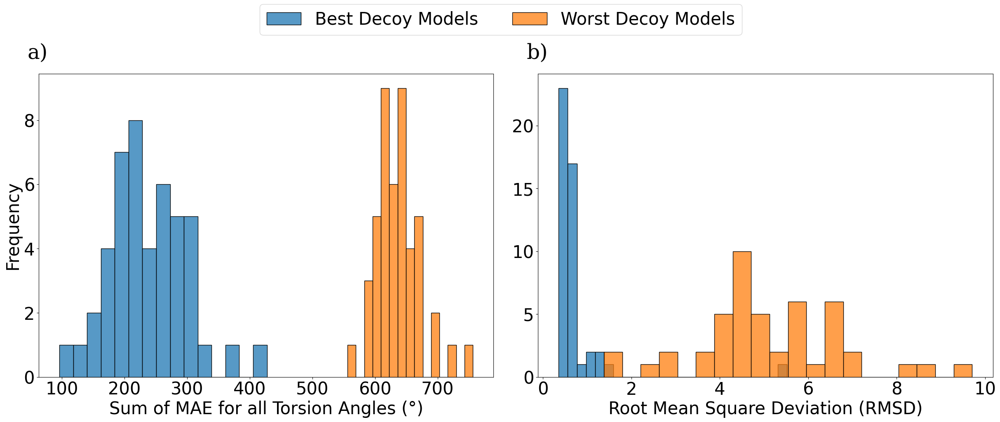

In [9]:
plt.rcParams.update({'font.size': 30})
matplotlib.rc('xtick', labelsize=30) 
matplotlib.rc('ytick', labelsize=30)

fig, axs = plt.subplot_mosaic([['a)', 'b)']], layout='constrained', figsize=(25, 10))
((_, ax1), (_, ax2)) = axs.items()

for label, ax in axs.items():
    # label physical distance to the left and up:
    trans = mtransforms.ScaledTranslation(-20/72, 7/72, fig.dpi_scale_trans)
    ax.text(0.0, 1.02, label, transform=ax.transAxes + trans,
            fontsize='large', va='bottom', fontfamily='serif')
    
sns.histplot([x['MAE_sum'] for x in all_minimum_mae_rows], label="Best Decoy Models", bins=15, ax=ax1)
sns.histplot([x['MAE_sum'] for x in all_maximum_mae_rows], label="Worst Decoy Models", bins=15, ax=ax1)
ax1.set_xlabel("Sum of MAE for all Torsion Angles (°)")
ax1.set_ylabel("Frequency")

sns.histplot([x['RMSD-ALL'] for x in all_minimum_mae_rows], label="Best Decoy Models", bins=25, ax=ax2)
sns.histplot([x['RMSD-ALL'] for x in all_maximum_mae_rows], label="Worst Decoy Models", bins=20, ax=ax2)
ax2.set_ylabel('')
ax2.set_xlabel("Root Mean Square Deviation (RMSD)")


# Get the handles and labels from the first subplot
all_handles = list()
all_labels = list()
handles, labels = ax1.get_legend_handles_labels()
for each_label_idx , each_label in enumerate(labels):
    if each_label not in all_labels:
        all_labels.append(each_label)
        all_handles.append(handles[each_label_idx])
        
legend = fig.legend(all_handles, all_labels, ncols=len(all_labels), loc='upper center', bbox_to_anchor=(0.5, 1.07))


plt.tight_layout()
plt.savefig(f'images/min_max_mae_maes_rmsds.svg', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
print(all_minimum_mae_rows)

In [16]:
for pdb_index in range(len(all_minimum_mae_rows)):


    rnapot_decoys_directory = "/home2/sriram.devata/rna_project/rnapot/decoys/"
    native_pdb_id = all_minimum_mae_rows[pdb_index]["Structure"].split('_')[0]
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{native_pdb_id}.pdb"
    
    prody_native_pdb = prody.parsePDB(each_pdb_file)
    if len(prody_native_pdb) < 2000:
        continue
        
    prody_native_pdb = prody_native_pdb.select('all')
    
    view=py3Dmol.view()

    # Native structure
    native_pdb_id = all_minimum_mae_rows[pdb_index]["Structure"].split('_')[0]
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{native_pdb_id}.pdb"
    pdbdata=open(each_pdb_file, 'r').read()
    view.addModel(pdbdata,'pdb')

    # ------------- Minimum MAE -------------------
    minimum_pdb_id = all_minimum_mae_rows[pdb_index]["Structure"]
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{minimum_pdb_id}.pdb"
    
    # Align the minimum MAE to the native structure
    prody_minimum_mae_pdb = prody.parsePDB(each_pdb_file)
    prody_minimum_mae_pdb_selection = prody_minimum_mae_pdb.select('all')
    prody.setAlignmentMethod("local")
#     map_native_minimum, map_minimum_native, seqid, overlap = prody.matchChains(prody_native_pdb,
#                                                                             prody_minimum_mae_pdb_selection)[0]
    _, map_native_minimum, map_minimum_native, seqid, overlap = prody.matchAlign(prody_native_pdb,
                                                                            prody_minimum_mae_pdb_selection,
                                                                            tarsel="all")
    # print(f"{map_native_minimum} ({len(map_native_minimum)})\n{map_minimum_native} ({len(map_minimum_native)})")
    transformation = prody.calcTransformation(map_minimum_native, map_native_minimum)
    # print(f"Transformation: {transformation}")
    prody.applyTransformation(transformation, prody_minimum_mae_pdb)
    
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{minimum_pdb_id}_aligned.pdb"
    prody.writePDB(each_pdb_file, prody_minimum_mae_pdb)
    
    pdbdata=open(each_pdb_file, 'r').read()
    view.addModel(pdbdata,'pdb')
    
    view.zoomTo()
    view.setBackgroundColor('white')
    view.zoomTo()

    view.setStyle({'model': 0},{'cartoon': {'color':'black'}})
    view.setStyle({'model': 1},{'cartoon': {'color':'green', 'opacity' : 0.85}})
    view.show()
    view.png()
    
    
    
    # Native structure
    view=py3Dmol.view()
    native_pdb_id = all_minimum_mae_rows[pdb_index]["Structure"].split('_')[0]
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{native_pdb_id}.pdb"
    pdbdata=open(each_pdb_file, 'r').read()
    view.addModel(pdbdata,'pdb')

    # ------------- Maximum MAE -------------------
    maximum_pdb_id = all_maximum_mae_rows[pdb_index]["Structure"]
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{maximum_pdb_id}.pdb"
    
    
    
    # Align the maximum MAE to the native structure
    prody_maximum_mae_pdb = prody.parsePDB(each_pdb_file)
    prody_maximum_mae_pdb_selection = prody_maximum_mae_pdb.select('all')
    prody.setAlignmentMethod("local")
#     map_native_minimum, map_minimum_native, seqid, overlap = prody.matchChains(prody_native_pdb,
#                                                                             prody_minimum_mae_pdb_selection)[0]
    _, map_native_maximum, map_maximum_native, seqid, overlap = prody.matchAlign(prody_native_pdb,
                                                                            prody_maximum_mae_pdb_selection,
                                                                            tarsel="all")
    transformation = prody.calcTransformation(map_maximum_native, map_native_maximum)
    prody.applyTransformation(transformation, prody_maximum_mae_pdb)
    
    each_pdb_file = f"{rnapot_decoys_directory}/{native_pdb_id}/{maximum_pdb_id}_aligned.pdb"
    prody.writePDB(each_pdb_file, prody_maximum_mae_pdb)
    
    
    pdbdata=open(each_pdb_file, 'r').read()
    view.addModel(pdbdata,'pdb')

    view.zoomTo()
    view.setBackgroundColor('white')
    view.zoomTo()

    view.setStyle({'model': 0},{'cartoon': {'color':'black'}})
    view.setStyle({'model': 1},{'cartoon': {'color':'red', 'opacity' : 0.85}})
    
    
    view.show()
    view.png()

@> 980 atoms and 1 coordinate set(s) were parsed in 0.07s.
@> 2600 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> 2600 atoms and 1 coordinate set(s) were parsed in 0.09s.
@> Checking AtomGroup 3cpw9: 1 chains are identified
@> Checking AtomGroup 3cpw9_M9: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain 9 from 3cpw9 (len=122) and Chain 9 from 3cpw9_M9 (len=122):
@> 	Failed to match chains (seqid=0%, overlap=0%).
@> Trying to match chains based on local sequence alignment:
@>  Comparing Chain 9 from 3cpw9 (len=122) and Chain 9 from 3cpw9_M9 (len=122):
@> 	Match: 122 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2600 atoms matching 'all'.
@> Before alignment RMSD: 1.03
@> After alignment  RMSD: 0.91
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign we

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 2600 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> Checking AtomGroup 3cpw9: 1 chains are identified
@> Checking AtomGroup 3cpw9_M335: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain 9 from 3cpw9 (len=122) and Chain 9 from 3cpw9_M335 (len=122):
@> 	Failed to match chains (seqid=0%, overlap=0%).
@> Trying to match chains based on local sequence alignment:
@>  Comparing Chain 9 from 3cpw9 (len=122) and Chain 9 from 3cpw9_M335 (len=122):
@> 	Match: 122 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2600 atoms matching 'all'.
@> Before alignment RMSD: 5.45
@> After alignment  RMSD: 4.72
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 414 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> 231 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 1243 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 1527 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 636 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 2169 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> 2169 atoms and 1 coordinate set(s) were parsed in 0.08s.
@> Checking AtomGroup 1z43A: 1 chains are identified
@> Checking AtomGroup 1z43A_M5: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain A from 1z43A (len=101) and Chain A from 1z43A_M5 (len=101):
@> 	Failed to match chains (seqid=0%, overlap=0%).
@> Trying to match chains based on local sequence alignment:
@>  Comparing Chain A from 1z43A (len=101) and Chain A from 1z43A_M5 (len=101):
@> 	Match: 101 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2169 atoms matching 'all'.
@> Before a

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 2169 atoms and 1 coordinate set(s) were parsed in 0.08s.
@> Checking AtomGroup 1z43A: 1 chains are identified
@> Checking AtomGroup 1z43A_M450: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain A from 1z43A (len=101) and Chain A from 1z43A_M450 (len=101):
@> 	Failed to match chains (seqid=0%, overlap=0%).
@> Trying to match chains based on local sequence alignment:
@>  Comparing Chain A from 1z43A (len=101) and Chain A from 1z43A_M450 (len=101):
@> 	Match: 101 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2169 atoms matching 'all'.
@> Before alignment RMSD: 5.59
@> After alignment  RMSD: 4.66
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 1541 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> 429 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 419 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 784 atoms and 1 coordinate set(s) were parsed in 0.07s.
@> 2505 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> 2505 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> Checking AtomGroup 3f1hB: 1 chains are identified
@> Checking AtomGroup 3f1hB_M10: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain B from 3f1hB (len=117) and Chain B from 3f1hB_M10 (len=117):
@> 	Match: 117 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2505 atoms matching 'all'.
@> Before alignment RMSD: 2.84
@> After alignment  RMSD: 0.88
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 2505 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> Checking AtomGroup 3f1hB: 1 chains are identified
@> Checking AtomGroup 3f1hB_M439: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain B from 3f1hB (len=117) and Chain B from 3f1hB_M439 (len=117):
@> 	Match: 117 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2505 atoms matching 'all'.
@> Before alignment RMSD: 4.86
@> After alignment  RMSD: 4.72
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 717 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 1499 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 1185 atoms and 1 coordinate set(s) were parsed in 0.05s.
@> 1052 atoms and 1 coordinate set(s) were parsed in 0.05s.
@> 1497 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> 702 atoms and 1 coordinate set(s) were parsed in 0.05s.
@> 503 atoms and 1 coordinate set(s) were parsed in 0.07s.
@> 617 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 751 atoms and 1 coordinate set(s) were parsed in 0.07s.
@> 1118 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 1640 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> 790 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 488 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> 578 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 816 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 2516 atoms and 1 coordinate set(s) were parsed in 0.08s.
@> 2516 atoms and 1 coordinate set(s) were parsed

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 2516 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> Checking AtomGroup 1y699: 1 chains are identified
@> Checking AtomGroup 1y699_M500: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain 9 from 1y699 (len=118) and Chain 9 from 1y699_M500 (len=118):
@> 	Match: 118 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2516 atoms matching 'all'.
@> Before alignment RMSD: 4.25
@> After alignment  RMSD: 4.23
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 1603 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 577 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 664 atoms and 1 coordinate set(s) were parsed in 0.05s.
@> 1304 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 2991 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> 2984 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> WARNING no one-letter mapping found for <Residue: GTP 1 from Chain S from 2nz4S (20 atoms)> 
@> Checking AtomGroup 2nz4S: 1 chains are identified
@> Checking AtomGroup 2nz4S_M5: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain S from 2nz4S (len=141) and Chain S from 2nz4S_M5 (len=140):
@> 	Match: 140 residues match with 100% sequence identity and 99% overlap.
@> Alignment is based on 2968 atoms matching 'all'.
@> Before alignment RMSD: 1.45
@> After alignment  RMSD: 0.84
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are 

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 2984 atoms and 1 coordinate set(s) were parsed in 0.04s.
@> WARNING no one-letter mapping found for <Residue: GTP 1 from Chain S from 2nz4S (20 atoms)> 
@> Checking AtomGroup 2nz4S: 1 chains are identified
@> Checking AtomGroup 2nz4S_M11: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain S from 2nz4S (len=141) and Chain S from 2nz4S_M11 (len=140):
@> 	Match: 140 residues match with 100% sequence identity and 99% overlap.
@> Alignment is based on 2968 atoms matching 'all'.
@> Before alignment RMSD: 2.77
@> After alignment  RMSD: 1.49
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 556 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 333 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 1055 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 703 atoms and 1 coordinate set(s) were parsed in 0.07s.
@> 533 atoms and 1 coordinate set(s) were parsed in 0.05s.
@> 600 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 468 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 573 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 1004 atoms and 1 coordinate set(s) were parsed in 0.06s.
@> 2029 atoms and 1 coordinate set(s) were parsed in 0.03s.
@> 2025 atoms and 1 coordinate set(s) were parsed in 0.07s.
@> Checking AtomGroup 2gisA: 1 chains are identified
@> Checking AtomGroup 2gisA_M5: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain A from 2gisA (len=94) and Chain A from 2gisA_M5 (len=94):
@> 	Match: 94 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based 

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 2025 atoms and 1 coordinate set(s) were parsed in 0.09s.
@> Checking AtomGroup 2gisA: 1 chains are identified
@> Checking AtomGroup 2gisA_M470: 1 chains are identified
@> Trying to match chains based on residue numbers and names:
@>   Comparing Chain A from 2gisA (len=94) and Chain A from 2gisA_M470 (len=94):
@> 	Match: 94 residues match with 100% sequence identity and 100% overlap.
@> Alignment is based on 2025 atoms matching 'all'.
@> Before alignment RMSD: 4.93
@> After alignment  RMSD: 4.92
@> WARNING mobile is an AtomMap instance, consider assign weights=mobile.getFlags("mapped") if there are dummy atoms in mobile
@> WARNING target is an AtomMap instance, consider assign weights=target.getFlags("mapped") if there are dummy atoms in target


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

@> 491 atoms and 1 coordinate set(s) were parsed in 0.02s.
@> 746 atoms and 1 coordinate set(s) were parsed in 0.01s.
@> 436 atoms and 1 coordinate set(s) were parsed in 0.01s.


In [ ]:
view=py3Dmol.view()

rnapot_decoys_directory = "/home2/sriram.devata/rna_project/rnapot/decoys/"
each_pdb_file = f"{rnapot_decoys_directory}/2nz4S/2nz4S.pdb"
pdbdata=open(each_pdb_file, 'r').read()
view.addModel(pdbdata,'pdb')

view.zoomTo()
view.setBackgroundColor('white')

# view.setStyle({'model': 0}, {'cartoon':{'width': 0.1, 'color':'green'}})
# view.addStyle({'resi':["91-95","42-50"]},{'cartoon':{'color':"red",'thickness':1.0}})

view.setStyle({'model': 0}, {'cartoon':{'hidden':False}})
view.setViewStyle({'style':"outline"})
view.addStyle({'model': 0}, {'cartoon':{'color':'green'}})
# view.addStyle({'atom': ["C1'", "C2'", "C3'", "C4'", "C5'"], 'invert':True}, {'line':{'color':'green'}})
# view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
#                             {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

view.show()
view.png()
